### Table of Contents

* [Chapter 1 : Image Processing](#chapter1)
    * [Step 1 : Download Images](#section_1)
    * [Section 1.1 : Import and Config](#section_1_1)
    * [Section 1.2](sSection_1_2)
        * [Section 1.2.1](#section_1_2_1)
        * [Section 1.2.2](#section_1_2_2)
        * [Section 1.2.3](#section_1_2_3)

# Facade Parsing using Image Segmentation
Summary :   
## Chapter 1 - Image processing<a class="anchor" id="chapter1"></a>
Chapter Summary: The process is not entirely automated. Users are therefore responsible for filtering out the bette-viewed images from the extracted images.  
Author :  
Date :   



### Step 1: Download Panoramas from Google Street View<a class="anchor" id="section_1"></a>


#### 1.1 - Import and Config<a class="anchor" id="section_1_1"></a>

In [14]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [21]:
# Package import
import cv2 
import geopandas as gps
import json
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import requests
import shapely.geometry
import shapefile
import sys

# Module import
from IPython.display import Image, display
from shapely.geometry import Polygon, Point, LineString
#from skimage import io

# Local imports
from src import streetview 
from src import compassbearing
from src import Equirectangular_to_Perspective_projection
from src import checker_n_finder

#### 1.2 - Download all panorama near to the given location<a class="anchor" id="section_1_2"></a>

In [16]:
# User Inputs
lat_in = 57.7003612
lon_in = 11.9825506
fov= 120 # can vary but it quite good to start with
pitch= 0 # can be vary depending on buildings
height = 1000 # for large building and 720 for small buildings
width = 1000 # pretty goog to strart with
# Create helper to select result images
pano_sequence = 0

In [23]:
def get_image(lat=lat_in,lon=lon_in,pano_sequence = pano_sequence,fov=fov,pitch = pitch, height = height,width = width):
    panoids = streetview.panoids(lat=lat_in, lon=lon_in)
    panoid = panoids[pano_sequence]['panoid']
    lat = panoids[pano_sequence]['lat']
    lon = panoids[pano_sequence]['lon']
    panorama = streetview.download_panorama_v3(panoid, zoom=2, disp=False)
    # Save image
    rgbImg = cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB)
    im_path = "data/img/Panorama_image.jpg"
    cv2.imwrite(im_path, rgbImg)
    # save the entire JSON response as a geojson for outside use
    json_path = 'data/json/gsvp_data.json'
    with open(json_path, 'w') as outfile:
        json.dump(panoids, outfile)
    # Load Buildings
    gdf = gps.read_file("data/shp/hedasgatan.shp")
    gdf = gdf.set_crs('EPSG:4326')

    # Load camera positions
    array_data = json.load(open('data/json/gsvp_data.json'))
    df_camera = pd.json_normalize(array_data)
    gdf_camera = gps.GeoDataFrame(
        df_camera, geometry=gps.points_from_xy(df_camera.lon, df_camera.lat),crs = 'EPSG:4326')

    gdf = gdf.to_crs('EPSG:3006')
    gdf_camera = gdf_camera.to_crs('EPSG:3006')
    # Change marker visualisation for plot
    c = [] # color
    s = [] # size
    a = [] # alpha - Transparancy
    
    for id in list(gdf_camera['panoid']):
        if id == panoid:
            c.append('red')
            s.append(100)
            a.append(1) 
        else:
            c.append('blue')
            s.append(10)
            a.append(0.5)

    d = {'lon': [lon], 'lat': [lat]}
    df_current_point = pd.DataFrame(data=d)
    gdf_current_point = gps.GeoDataFrame(df_current_point,
                                         geometry=gps.points_from_xy(df_current_point.lon
                                                                     , df_current_point.lat),
                                         crs = 'EPSG:4326')
    gdf_current_point = gdf_current_point.to_crs('EPSG:3006')
    current_point = gdf_current_point.iloc[0,2]
    gdf_street = gps.read_file("data/shp/roads.shp")
    gdf_street = gdf_street.to_crs('EPSG:3006')
    polygon_index = gdf_street.distance(current_point).sort_values().index[0]
    street = gdf_street.loc[polygon_index]
    start,end = Point(street.geometry.coords[0]), Point(street.geometry.coords[-1])
    camera_direction = compassbearing.get_bearing(end,start)
    right = (camera_direction+90) %360
    left = (camera_direction+270) %360
    camera_direction,left,right
    ### Apply Projection on Panorama Imagery and Get single Image
    equ = Equirectangular_to_Perspective_projection.Equirectangular(im_path)
    length = 30
    n = 0 
    # Plot
    building_ids = []
    checkers = []
    for heading in [left,right]:
        checker = checker_n_finder.create_checker(current_point,heading,length)
        checkers.append(checker)
        building_id = checker_n_finder.find_building(gdf,checker)
        building_ids.append(building_id)
    i = 0
    uid = 1000
    for heading in [270, 90]:
        checker = checkers[i]
        building_id = checker_n_finder.find_building(gdf,checker)
        building_ids.append(building_id)
        i+=1
        img = equ.GetPerspective(fov, heading, pitch, height, width)
        rgbImg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        cv2.imwrite(f"data/img_eq/{n}_{heading}_{building_id}_{panoid}.jpg", img)
        n = n+1
        fig_dims = (5, 5)
        fig, ax = plt.subplots(figsize=fig_dims)
        title = f"At heading:{str(heading)}, you are facing building :{building_id}"
        ax.set_title(title)
        plt.imshow(rgbImg)
        plt.show()

    # Change marker visualisation for plot
    c = [] # color
    s = [] # size
    a = [] # alpha - Transparancy
    for id in list(gdf_camera['panoid']):
        if id == panoid:
            c.append('red')
            s.append(100)
            a.append(1) 
        else:
            c.append('blue')
            s.append(10)
            a.append(0.5)
    # Change building visualisation for plot    
    c_build = []
    a_build = []
    for osm_id in list(gdf['osm_id']):
        if osm_id in building_ids:
            c_build.append('green')
            a_build.append(1)
        else:
            c_build.append('grey')
            a_build.append(0.5)

    fig, axes = plt.subplots(figsize=(10, 20))
    axes.set_title('Identified buildings')
    for a_b in a_build:
        gdf.plot(ax = axes,color = c_build, alpha = a_b)
    for k in a:
        gdf_camera.plot(ax = axes,color = c, markersize = s,alpha = k)
    for checker in checkers:
        x, y = checker.xy
        axes.plot(x, y,alpha=0.7, linewidth=3, solid_capstyle='round', zorder=2)
    # Plot Street
    x,y = street.geometry.xy
    axes.plot(x,y)
    

In [18]:
# Run over all panorama images

In [25]:
panoids = streetview.panoids(lat=lat_in, lon=lon_in)
#print(len(panoids))

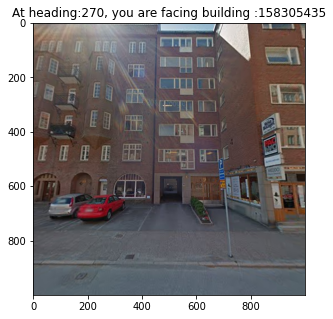

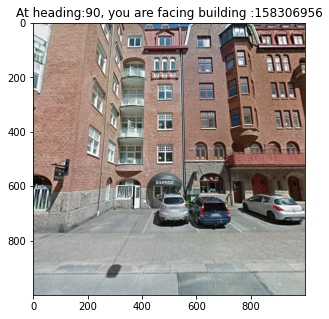

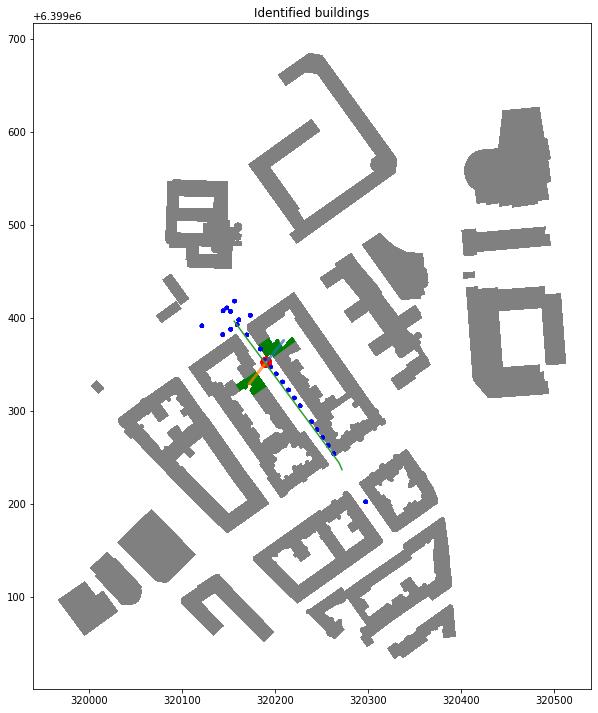

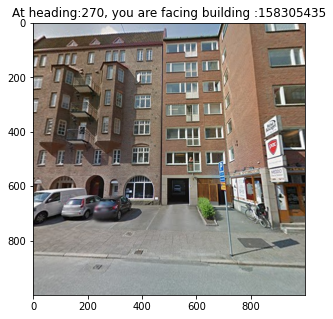

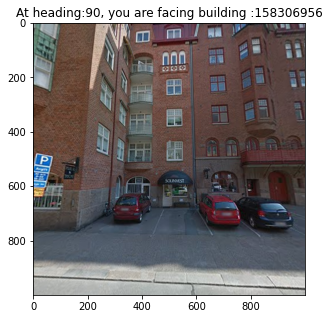

...

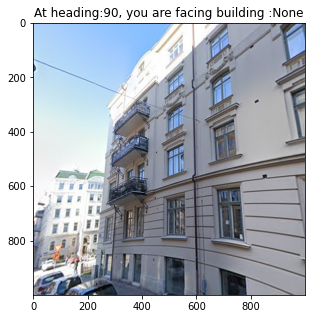

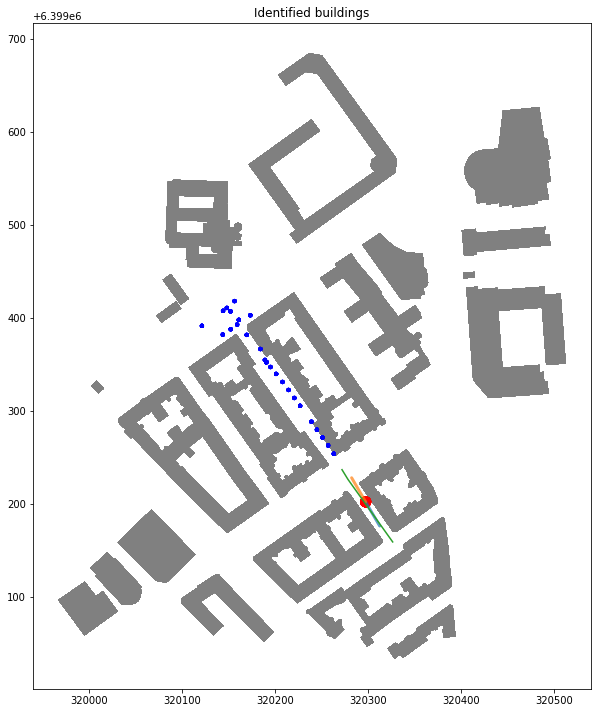

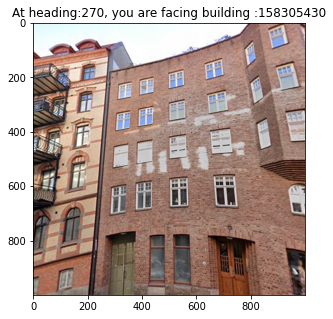

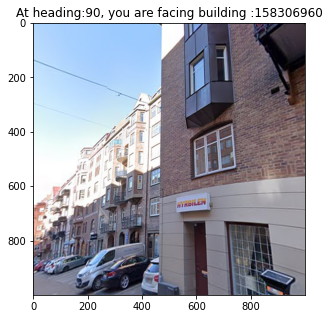

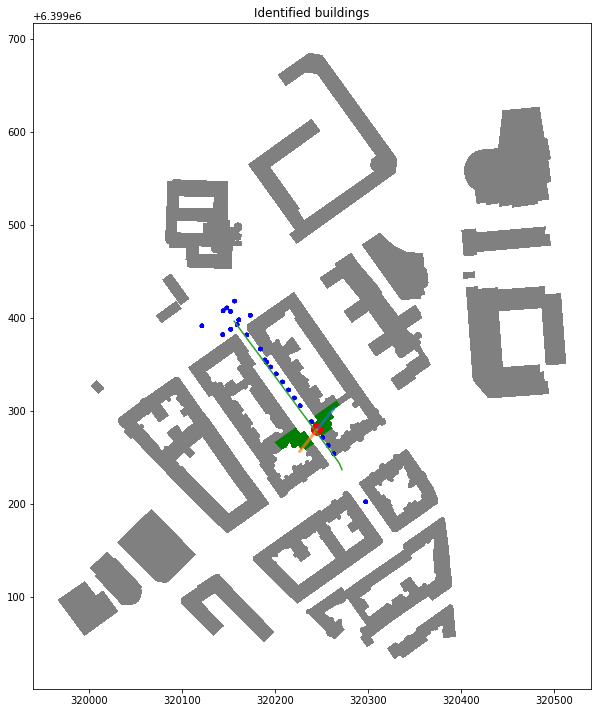

In [24]:
for i in range(len(panoids)):
    get_image(lat=57.699064, 
              lon=11.983491,
              pano_sequence = i,
              fov=90,
              pitch = 10,
              height = 1000,
              width = 1000)